In [3]:
%reload_ext autoreload
%autoreload 2

In [4]:
import spyglass as nd
import pandas as pd
# ignore datajoint+jupyter async warnings
import warnings
warnings.simplefilter('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=ResourceWarning)

Connecting shijiegu@lmf-db.cin.ucsf.edu:3306


In [5]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import logging
import os
import cupy as cp

FORMAT = '%(asctime)s %(message)s'

logging.basicConfig(level='INFO', format=FORMAT, datefmt='%d-%b-%y %H:%M:%S')

In [6]:
from spyglass.common import (Session, IntervalList,IntervalPositionInfo,
                             LabMember, LabTeam, Raw, Session, Nwbfile,
                            Electrode,LFPBand,interval_list_intersect)
from spyglass.common.common_interval import _intersection

import spyglass.spikesorting as ss
from spyglass.spikesorting import (SortGroup, 
                                    SortInterval,
                                    SpikeSortingPreprocessingParameters,
                                    SpikeSortingRecording, 
                                    SpikeSorterParameters,
                                    SpikeSortingRecordingSelection,
                                    ArtifactDetectionParameters, ArtifactDetectionSelection,
                                    ArtifactRemovedIntervalList, ArtifactDetection,
                                      SpikeSortingSelection, SpikeSorting,
                                   CuratedSpikeSortingSelection,CuratedSpikeSorting,Curation)
from spyglass.decoding.clusterless import (UnitMarks,
                                           UnitMarkParameters,UnitMarksIndicatorSelection,
                                          UnitMarksIndicator)
from spyglass.common.nwb_helper_fn import get_nwb_copy_filename
from spyglass.common.common_position import IntervalPositionInfo, IntervalPositionInfoSelection

# Here are the analysis tables specific to Shijie Gu
from spyglass.Analysis_SGU import TrialChoice,Decode

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/seaborn/rcmod.py:82: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


In [8]:
nwb_copy_file_name = 'molly20220415_.nwb'

In [9]:
def interval_union(interval_list1,interval_list2):
    '''
    interval_list1 : np.array, (N,2) where N = number of intervals
    interval_list2 : np.array, (N,2) where N = number of intervals
    
    e.g.
    interval_list1 = np.array([[1,11],[6,8],[12,20],[25,30]])
    interval_list2 = np.array([[1,10]])
    
    Returns
    -------
    interval_list: np.array, (N,2)

    '''
    interval_list1=interval_list1.tolist()
    interval_list2=interval_list2.tolist()
    
    # find all pairwise intersections
    intersect_tally=np.zeros((len(interval_list1),len(interval_list2)))
    for i in range(len(interval_list1)):
        for j in range(len(interval_list2)):
            if _intersection(interval_list1[i],interval_list2[j]) is not None:
                intersect_tally[i,j]=1

    union_set=[]
    union_list2_ind=np.argwhere(np.sum(intersect_tally,axis=0)==0).ravel()
    union_list1_ind=np.argwhere(np.sum(intersect_tally,axis=1)==0).ravel()

    # for those in set 1 or set 2 that has no intersections, append zero row sum or column sum 
    for i in union_list1_ind:
        union_set.append(interval_list1[i])
    for i in union_list2_ind:
        union_set.append(interval_list2[i])
    
    # for those that has intersections, find mutually intersecting interva;s
    for i in np.argwhere(np.sum(intersect_tally,axis=1)!=0).ravel():
        intvl_1=np.array([interval_list1[i]])
        
        intvl_1s=[]
        # first, find the intersecting one in set 2
        j_all=np.argwhere(intersect_tally[i,:]).ravel()
        intvl_2s=np.array([interval_list2[j] for j in j_all])
        
        # then track back in set 1, to find all the ones in set 1 intersecting this one in set 2
        for j in j_all:
            i_all=np.argwhere(intersect_tally[:,j]).ravel()
            for i in i_all:
                intvl_1s.append(interval_list1[i])
        
        # put all the related/intersecting intervals together, find union
        union_tmp=np.concatenate([np.array(intvl_1s),intvl_2s],axis=0)
        
        union_set.append([np.min(union_tmp[:,0]),np.max(union_tmp[:,1])])
    union_set=np.unique(union_set,axis=0)   
    return union_set

In [10]:
def populate_mark_indicators(
        spikesorting_selection_keys: list,
        mark_param_name='default',
        position_info_param_name='default'
):
    # Populate spike sorting
    SpikeSortingSelection().insert(
        spikesorting_selection_keys,
        skip_duplicates=True,
    )
    SpikeSorting.populate(spikesorting_selection_keys)

    # Skip any curation
    curation_keys = [Curation.insert_curation(
        key) for key in spikesorting_selection_keys]

    CuratedSpikeSortingSelection().insert(
        curation_keys,
        skip_duplicates=True
    )
    CuratedSpikeSorting.populate(
        CuratedSpikeSortingSelection() & curation_keys)

    # Populate marks
    mark_parameters_keys = pd.DataFrame(CuratedSpikeSorting & curation_keys)
    mark_parameters_keys['mark_param_name'] = mark_param_name
    mark_parameters_keys = (mark_parameters_keys
                            .loc[:, UnitMarkParameters.primary_key]
                            .to_dict('records'))
    UnitMarkParameters().insert(
        mark_parameters_keys,
        skip_duplicates=True
    )
    UnitMarks.populate(UnitMarkParameters & mark_parameters_keys)

    # Compute mark indicators for each position epoch
    nwb_file_name = spikesorting_selection_keys[0]['nwb_file_name']
    position_interval_names = (IntervalPositionInfo() & {
        'nwb_file_name': nwb_file_name,
        'position_info_param_name': position_info_param_name
    }).fetch('interval_list_name')

    for interval_name in tqdm(position_interval_names):
        position_interval = (
            IntervalList &
            {'nwb_file_name': nwb_file_name,
             'interval_list_name': interval_name})

        marks_selection = ((UnitMarks & mark_parameters_keys) *
                           position_interval)
        marks_selection = (pd.DataFrame(marks_selection)
                           .loc[:, marks_selection.primary_key]
                           .to_dict('records'))
        UnitMarksIndicatorSelection.insert(
            marks_selection, skip_duplicates=True)
        UnitMarksIndicator.populate(marks_selection)

In [11]:
def thresholder_sort(sort_interval_name):
    artifact_params_name='ampl_100_prop_05_2ms'
    #sort_interval_name='04_Seq2Session2'

    artifact_key=(ArtifactDetection() & {'nwb_file_name' : nwb_copy_file_name} 
                              & {'artifact_params_name': artifact_params_name}
                              & {'sort_interval_name':sort_interval_name})
    # fetch, and there should be 2 entries, one from left cannula (group 100), and one from right cannula (group 101)
    artifact_removed_name_list=artifact_key.fetch('artifact_removed_interval_list_name')
    assert len(artifact_removed_name_list)==2

    artifact_time_list=[]
    artifact_removed_time_list=[]
    for artifact_removed_name in artifact_removed_name_list:
        artifact_time_list.append((ArtifactDetection() & {'nwb_file_name' : nwb_copy_file_name,'artifact_removed_interval_list_name':artifact_removed_name}).fetch1('artifact_times'))
        artifact_removed_time_list.append((IntervalList() & {'nwb_file_name' : nwb_copy_file_name,'interval_list_name':artifact_removed_name}).fetch1('valid_times'))

    artifact_time_list=interval_union(artifact_time_list[0],artifact_time_list[1])
    artifact_removed_time_list=interval_list_intersect(artifact_removed_time_list[0],artifact_removed_time_list[1])
    
    # find tetrodes
    tetrode_with_cell=np.unique((SpikeSortingRecordingSelection & {'nwb_file_name':nwb_copy_file_name}).fetch('sort_group_id'))
    tetrode_with_cell=np.setdiff1d(tetrode_with_cell,[100,101])
    
    # insert into individual tetrodes ArtifactRemovedIntervalList
    artifact_params_name='ampl_1500_prop_075_1ms'
    sorting_keys=[]
    for tetrode in tetrode_with_cell:
        print(tetrode)
        artifact_key = {'nwb_file_name' : nwb_copy_file_name,
                    'sort_interval_name' : sort_interval_name,
                    'sort_group_id' : tetrode,
                    'preproc_params_name': 'franklab_tetrode_hippocampus',
                    'team_name': 'Shijie Gu'}                    
        artifact_key['artifact_params_name'] = artifact_params_name

        ArtifactDetectionSelection.insert1(artifact_key, skip_duplicates=True)

        artifact_key['artifact_times']=artifact_time_list
        artifact_key['artifact_removed_valid_times']=artifact_removed_time_list

        artifact_name=(nwb_copy_file_name+'_'+sort_interval_name+'_'+str(artifact_key['sort_group_id'])+'_'+
                       artifact_key['preproc_params_name']+'_'+artifact_params_name+'_artifact_removed_valid_times')

        artifact_key['artifact_removed_interval_list_name']=artifact_name

        ArtifactRemovedIntervalList().insert1(artifact_key,skip_duplicates=True)

        IntervalList().insert1({'nwb_file_name' : nwb_copy_file_name,
                               'interval_list_name':artifact_name,
                               'valid_times':artifact_removed_time_list},skip_duplicates=True)

        artifact_key.pop('artifact_params_name')
        artifact_key.pop('artifact_times')
        artifact_key.pop('artifact_removed_valid_times')

        artifact_key['sorter'] = 'clusterless_thresholder'
        artifact_key['sorter_params_name'] = 'default'

        SpikeSortingSelection.insert1(artifact_key, skip_duplicates=True)

        sorting_keys.append(artifact_key.copy())
    
    # populate
    SpikeSorting.populate({'nwb_file_name':nwb_copy_file_name,
                    'artifact_params_name': artifact_params_name, # make sure to inlude this
                    'sort_interval_name':sort_interval_name})
    return sorting_keys

In [25]:
(ArtifactRemovedIntervalList()&{'nwb_file_name':'molly20220420_.nwb',#nwb_copy_file_name,
                              'sort_group_id' : 3}).fetch('artifact_times')

array([array([], dtype=float64)], dtype=object)

## Marks

The first thing we need are the marks for the clusterless decoding. First, sort spikes by thresholder.


### artifact times

In [138]:
#ArtifactDetection & {'nwb_file_name':nwb_copy_file_name}

In [ ]:
# select position timestamps, only maze sessions are selected
position_interval=[]
session_interval=[]
for i in IntervalList_pd.index:
    interval=IntervalList_pd['interval_list_name'][i]
    if interval[-8:-1]=='Session':
        session_interval.append(interval)
    if interval[0:3]=='pos' and int(interval[4:6])%2==1:
        position_interval.append(interval)

In [ ]:
'''
artifact times
'''

for session in session_interval:
    sorting_keys=thresholder_sort(session)
# for one session:
#    sort_interval_name='04_Seq2Session2'
#    sorting_keys=thresholder_sort(sort_interval_name)

In [11]:
ArtifactRemovedIntervalList & {'nwb_file_name' : nwb_copy_file_name,'sort_interval_name' : sort_interval_name}

artifact_removed_interval_list_name,nwb_file_name name of the NWB file,sort_group_id identifier for a group of electrodes,sort_interval_name name for this interval,preproc_params_name,team_name,artifact_params_name,artifact_removed_valid_times,artifact_times np array of artifact intervals
molly20220420_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220420_.nwb,3,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220420_.nwb_04_Seq2Session2_6_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220420_.nwb,6,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220420_.nwb_04_Seq2Session2_7_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220420_.nwb,7,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220420_.nwb_04_Seq2Session2_9_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220420_.nwb,9,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220420_.nwb_04_Seq2Session2_10_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220420_.nwb,10,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220420_.nwb_04_Seq2Session2_12_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220420_.nwb,12,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220420_.nwb_04_Seq2Session2_15_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220420_.nwb,15,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220420_.nwb_04_Seq2Session2_17_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220420_.nwb,17,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220420_.nwb_04_Seq2Session2_18_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220420_.nwb,18,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220420_.nwb_04_Seq2Session2_24_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220420_.nwb,24,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=


In [12]:
(SpikeSortingSelection() 
                 & {'nwb_file_name':nwb_copy_file_name,
                    'artifact_params_name': artifact_params_name, # make sure to inlude this
                    'sort_interval_name':sort_interval_name})

NameError: name 'artifact_params_name' is not defined

In [13]:
SpikeSorting() & {'nwb_file_name' : nwb_copy_file_name,'sort_interval_name':sort_interval_name}

nwb_file_name name of the NWB file,sort_group_id identifier for a group of electrodes,sort_interval_name name for this interval,preproc_params_name,team_name,sorter,sorter_params_name,artifact_removed_interval_list_name,sorting_path,"time_of_sort in Unix time, to the nearest second"
molly20220420_.nwb,3,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220420_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_69abaf00_spikesorting,1656184815
molly20220420_.nwb,6,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_6_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220420_.nwb_04_Seq2Session2_6_franklab_tetrode_hippocampus_2afffb90_spikesorting,1656184842
molly20220420_.nwb,7,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_7_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220420_.nwb_04_Seq2Session2_7_franklab_tetrode_hippocampus_cb00f74e_spikesorting,1656184883
molly20220420_.nwb,9,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_9_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220420_.nwb_04_Seq2Session2_9_franklab_tetrode_hippocampus_d2a78153_spikesorting,1656184915
molly20220420_.nwb,10,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_10_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220420_.nwb_04_Seq2Session2_10_franklab_tetrode_hippocampus_c3034db4_spikesorting,1656184980
molly20220420_.nwb,12,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_12_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220420_.nwb_04_Seq2Session2_12_franklab_tetrode_hippocampus_0ad23b6c_spikesorting,1656185010
molly20220420_.nwb,15,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_15_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220420_.nwb_04_Seq2Session2_15_franklab_tetrode_hippocampus_4e852f10_spikesorting,1656185017
molly20220420_.nwb,17,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_17_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220420_.nwb_04_Seq2Session2_17_franklab_tetrode_hippocampus_8ae7ebcb_spikesorting,1656185026
molly20220420_.nwb,18,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_18_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220420_.nwb_04_Seq2Session2_18_franklab_tetrode_hippocampus_e6ce808d_spikesorting,1656185107
molly20220420_.nwb,24,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_24_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220420_.nwb_04_Seq2Session2_24_franklab_tetrode_hippocampus_8c030412_spikesorting,1656185173


In [14]:
curation_keys[0]

NameError: name 'curation_keys' is not defined

### Skip Curation

In [15]:
# Skip any curation
curation_keys = [Curation.insert_curation(key) for key in sorting_keys]

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/blob.py:191: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  if isinstance(obj, collections.Mapping):
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/blob.py:195: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  if isinstance(obj, collections.ByteString):
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/blob.py:197: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  if isinstance(obj, collections.MutableSequence):


In [16]:
Curation() & {'nwb_file_name' : nwb_copy_file_name}

curation_id a number correponding to the index of this curation,nwb_file_name name of the NWB file,sort_group_id identifier for a group of electrodes,sort_interval_name name for this interval,preproc_params_name,team_name,sorter,sorter_params_name,artifact_removed_interval_list_name,parent_curation_id,curation_labels a dictionary of labels for the units,merge_groups a list of merge groups for the units,quality_metrics a list of quality metrics for the units (if available),description optional description for this curated sort,"time_of_creation in Unix time, to the nearest second"
0,molly20220420_.nwb,3,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1656186320
0,molly20220420_.nwb,6,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_6_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1656186347
0,molly20220420_.nwb,7,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_7_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1656186350
0,molly20220420_.nwb,9,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_9_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1656186353
0,molly20220420_.nwb,10,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_10_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1656186360
0,molly20220420_.nwb,12,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_12_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1656186406
0,molly20220420_.nwb,15,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_15_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1656186423
0,molly20220420_.nwb,17,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_17_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1656186431
0,molly20220420_.nwb,18,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_18_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1656186470
0,molly20220420_.nwb,24,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220420_.nwb_04_Seq2Session2_24_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1656186503


In [43]:
IntervalList & {'interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}

nwb_file_name name of the NWB file,interval_list_name descriptive name of this interval list,valid_times numpy array with start and end times for each interval


In [ ]:
# Skip any curation
#curation_keys = [Curation.insert_curation(key) for key in sorting_keys]

CuratedSpikeSortingSelection().insert(
        curation_keys,
        skip_duplicates=True
    )
CuratedSpikeSorting.populate(
        CuratedSpikeSortingSelection() & curation_keys)

25-Jun-22 12:57:44 Found 21 keys to populate
25-Jun-22 12:57:44 Transaction started
25-Jun-22 12:57:44 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 3, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_XT34Z5OBP7.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_XT34Z5OBP7.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 12:57:55 Transaction committed and closed.
25-Jun-22 12:57:55 Transaction started
25-Jun-22 12:57:55 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_KXNCP7JIWP.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_KXNCP7JIWP.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 12:58:18 Transaction committed and closed.
25-Jun-22 12:58:18 Transaction started
25-Jun-22 12:58:18 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_78A9GWWXOG.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_78A9GWWXOG.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 12:58:40 Transaction committed and closed.
25-Jun-22 12:58:40 Transaction started
25-Jun-22 12:58:40 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_CLDH88WEHE.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_CLDH88WEHE.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 12:58:48 Transaction committed and closed.
25-Jun-22 12:58:48 Transaction started
25-Jun-22 12:58:48 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_XOZ1Z0IOKK.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_XOZ1Z0IOKK.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:


In [18]:
mark_parameters_keys = pd.DataFrame(CuratedSpikeSorting & curation_keys)
mark_parameters_keys['mark_param_name'] = 'default'
mark_parameters_keys = (mark_parameters_keys
                            .loc[:, UnitMarkParameters.primary_key]
                            .to_dict('records'))
UnitMarkParameters().insert(
        mark_parameters_keys,
        skip_duplicates=True
    )


In [19]:
UnitMarks.populate(UnitMarkParameters & mark_parameters_keys)

25-Jun-22 21:14:52 Found 21 keys to populate
25-Jun-22 21:14:52 Transaction started
25-Jun-22 21:14:52 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 3, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_XT34Z5OBP7.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as 

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_3HMADFFRZP.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_3HMADFFRZP.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:15:17 Transaction committed and closed.
25-Jun-22 21:15:17 Transaction started
25-Jun-22 21:15:17 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_EIGB9IOEEV.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_EIGB9IOEEV.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:15:29 Transaction committed and closed.
25-Jun-22 21:15:29 Transaction started
25-Jun-22 21:15:29 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_OHMBUO9RH7.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_OHMBUO9RH7.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:15:33 Transaction committed and closed.
25-Jun-22 21:15:33 Transaction started
25-Jun-22 21:15:33 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_QBJDYTJKQ3.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_QBJDYTJKQ3.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:16:07 Transaction committed and closed.
25-Jun-22 21:16:07 Transaction started
25-Jun-22 21:16:07 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_0O0U8Q0IC5.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_0O0U8Q0IC5.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:16:32 Transaction committed and closed.
25-Jun-22 21:16:32 Transaction started
25-Jun-22 21:16:32 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_CC3590CC0E.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_CC3590CC0E.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:16:38 Transaction committed and closed.
25-Jun-22 21:16:38 Transaction started
25-Jun-22 21:16:38 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_588FHQEKEI.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_588FHQEKEI.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:16:55 Transaction committed and closed.
25-Jun-22 21:16:55 Transaction started
25-Jun-22 21:16:55 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_SF3SYQLNS3.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_SF3SYQLNS3.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:17:23 Transaction committed and closed.
25-Jun-22 21:17:23 Transaction started
25-Jun-22 21:17:23 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_Q6Z714DYNU.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_Q6Z714DYNU.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:17:36 Transaction committed and closed.
25-Jun-22 21:17:36 Transaction started
25-Jun-22 21:17:36 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_J6QG5WSMSJ.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_J6QG5WSMSJ.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:17:45 Transaction committed and closed.
25-Jun-22 21:17:45 Transaction started
25-Jun-22 21:17:45 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_MD10UAMYEZ.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_MD10UAMYEZ.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:17:59 Transaction committed and closed.
25-Jun-22 21:17:59 Transaction started
25-Jun-22 21:17:59 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_45WI4TH6IW.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_45WI4TH6IW.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:18:11 Transaction committed and closed.
25-Jun-22 21:18:11 Transaction started
25-Jun-22 21:18:11 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_3G0CBHG7VY.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_3G0CBHG7VY.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:18:32 Transaction committed and closed.
25-Jun-22 21:18:32 Transaction started
25-Jun-22 21:18:32 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_G6EW2YBY1M.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_G6EW2YBY1M.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:19:13 Transaction committed and closed.
25-Jun-22 21:19:13 Transaction started
25-Jun-22 21:19:13 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_7A1FGDXDW8.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_7A1FGDXDW8.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:19:49 Transaction committed and closed.
25-Jun-22 21:19:49 Transaction started
25-Jun-22 21:19:49 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_ZSS7QYLFPT.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_ZSS7QYLFPT.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:19:54 Transaction committed and closed.
25-Jun-22 21:19:54 Transaction started
25-Jun-22 21:19:54 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_KTFMN480ZH.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_KTFMN480ZH.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:20:04 Transaction committed and closed.
25-Jun-22 21:20:04 Transaction started
25-Jun-22 21:20:04 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_AOZ4SFT6AZ.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_AOZ4SFT6AZ.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:20:09 Transaction committed and closed.
25-Jun-22 21:20:09 Transaction started
25-Jun-22 21:20:09 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_Z4TZYEPAP9.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_Z4TZYEPAP9.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:20:32 Transaction committed and closed.
25-Jun-22 21:20:32 Transaction started
25-Jun-22 21:20:32 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_317WCKFDIF.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_317WCKFDIF.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:20:49 Transaction committed and closed.
25-Jun-22 21:20:49 Transaction started
25-Jun-22 21:20:49 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f10b41f6be0>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f0d590bf640>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220420_6ECR0MXV5D.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_6ECR0MXV5D.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:20:54 Transaction committed and closed.


In [22]:
position_interval_names

array(['pos 1 valid times', 'pos 11 valid times', 'pos 3 valid times',
       'pos 5 valid times', 'pos 7 valid times', 'pos 9 valid times'],
      dtype=object)

In [23]:
# Compute mark indicators
nwb_copy_file_name = sorting_keys[0]['nwb_file_name']
position_interval_names = (IntervalPositionInfo() & {
        'nwb_file_name': nwb_copy_file_name,
        'position_info_param_name': 'default_decoding'
    }).fetch('interval_list_name')

interval_name='pos 3 valid times'
position_interval = (
        IntervalList &
        {'nwb_file_name': nwb_copy_file_name,
         'interval_list_name': interval_name})

marks_selection = ((UnitMarks & mark_parameters_keys) * position_interval)
marks_selection = (pd.DataFrame(marks_selection)
                   .loc[:, marks_selection.primary_key]
                   .to_dict('records'))
UnitMarksIndicatorSelection.insert(marks_selection, skip_duplicates=True)

In [24]:
UnitMarksIndicator.populate(marks_selection)
        

25-Jun-22 21:22:25 Found 21 keys to populate
25-Jun-22 21:22:25 Transaction started
25-Jun-22 21:22:25 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_group_id': 3, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220420_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default', 'interval_list_name': 'pos 3 valid times', 'sampling_rate': 500.0}
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_3HMADFFRZP.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/datase

Writing new NWB file molly20220420_2V2CRYNQ1S.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_2V2CRYNQ1S.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:22:45 Transaction committed and closed.
25-Jun-22 21:22:45 Transaction started
25-Jun-22 21:22:45 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_6KSQLSP7FO.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_6KSQLSP7FO.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:23:22 Transaction committed and closed.
25-Jun-22 21:23:22 Transaction started
25-Jun-22 21:23:22 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_WBJO4PCQ13.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_WBJO4PCQ13.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:23:36 Transaction committed and closed.
25-Jun-22 21:23:36 Transaction started
25-Jun-22 21:23:36 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_3B6YVTB5YB.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_3B6YVTB5YB.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:24:00 Transaction committed and closed.
25-Jun-22 21:24:00 Transaction started
25-Jun-22 21:24:00 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_8NVG900O8G.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_8NVG900O8G.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:24:26 Transaction committed and closed.
25-Jun-22 21:24:26 Transaction started
25-Jun-22 21:24:26 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_PZS695H4PC.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_PZS695H4PC.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:24:58 Transaction committed and closed.
25-Jun-22 21:24:58 Transaction started
25-Jun-22 21:24:58 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_SOKPXZO6QW.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_SOKPXZO6QW.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:25:27 Transaction committed and closed.
25-Jun-22 21:25:27 Transaction started
25-Jun-22 21:25:27 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_C511XTU5TU.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_C511XTU5TU.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:25:49 Transaction committed and closed.
25-Jun-22 21:25:49 Transaction started
25-Jun-22 21:25:49 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_7LEYLDBAPI.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_7LEYLDBAPI.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:26:12 Transaction committed and closed.
25-Jun-22 21:26:12 Transaction started
25-Jun-22 21:26:12 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_FWZIQDMUVH.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_FWZIQDMUVH.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:26:23 Transaction committed and closed.
25-Jun-22 21:26:23 Transaction started
25-Jun-22 21:26:23 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_7MYDYL3VRK.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_7MYDYL3VRK.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:27:22 Transaction committed and closed.
25-Jun-22 21:27:22 Transaction started
25-Jun-22 21:27:22 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_R616UZWD0F.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_R616UZWD0F.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:27:47 Transaction committed and closed.
25-Jun-22 21:27:47 Transaction started
25-Jun-22 21:27:47 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_IYGEZEU9YJ.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_IYGEZEU9YJ.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:28:09 Transaction committed and closed.
25-Jun-22 21:28:09 Transaction started
25-Jun-22 21:28:09 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_C9YEXYEUQ2.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_C9YEXYEUQ2.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:28:35 Transaction committed and closed.
25-Jun-22 21:28:35 Transaction started
25-Jun-22 21:28:35 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_8YA5X2WC6B.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_8YA5X2WC6B.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:29:53 Transaction committed and closed.
25-Jun-22 21:29:53 Transaction started
25-Jun-22 21:29:53 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_PDDHD1OX9E.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_PDDHD1OX9E.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:30:31 Transaction committed and closed.
25-Jun-22 21:30:31 Transaction started
25-Jun-22 21:30:31 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_SRJNVONDCL.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_SRJNVONDCL.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:31:01 Transaction committed and closed.
25-Jun-22 21:31:01 Transaction started
25-Jun-22 21:31:01 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_G4P10U642I.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_G4P10U642I.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:31:46 Transaction committed and closed.
25-Jun-22 21:31:46 Transaction started
25-Jun-22 21:31:46 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_R2S51BWU3P.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_R2S51BWU3P.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:32:16 Transaction committed and closed.
25-Jun-22 21:32:16 Transaction started
25-Jun-22 21:32:16 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_IVISGVX7DP.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_IVISGVX7DP.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:32:53 Transaction committed and closed.
25-Jun-22 21:32:53 Transaction started
25-Jun-22 21:32:53 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220420_.nwb', 'sort_gr

Writing new NWB file molly20220420_JZKGR9LYGF.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_JZKGR9LYGF.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
25-Jun-22 21:33:20 Transaction committed and closed.


After we've populated this table, we can fetch all the mark indicators from a set of electrodes using the `fetch_xarray` method. `xarray` is just a python package that produces labeled multidimensional arrays. The decoding results will also come in this format.

In [66]:
marks = (UnitMarksIndicator & {
    'nwb_file_name': nwb_copy_file_name,
    'interval_list_name': 'pos 3 valid times',   
}).fetch_xarray()
marks.shape

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_2V2CRYNQ1S.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_6KSQLSP7FO.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_WBJO4PCQ13.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly

(1093826, 4, 21)

After you get the marks, it is important to visualize them to make sure they look right. We can use the `plot_all_marks` method of UnitMarksIndicator to quickly plot each mark feature against the other for each electrode.

Here it is important to look for things that look overly correlated (strong diagonal on the off-diagonal plots) and for extreme amplitudes.

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_2V2CRYNQ1S.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)


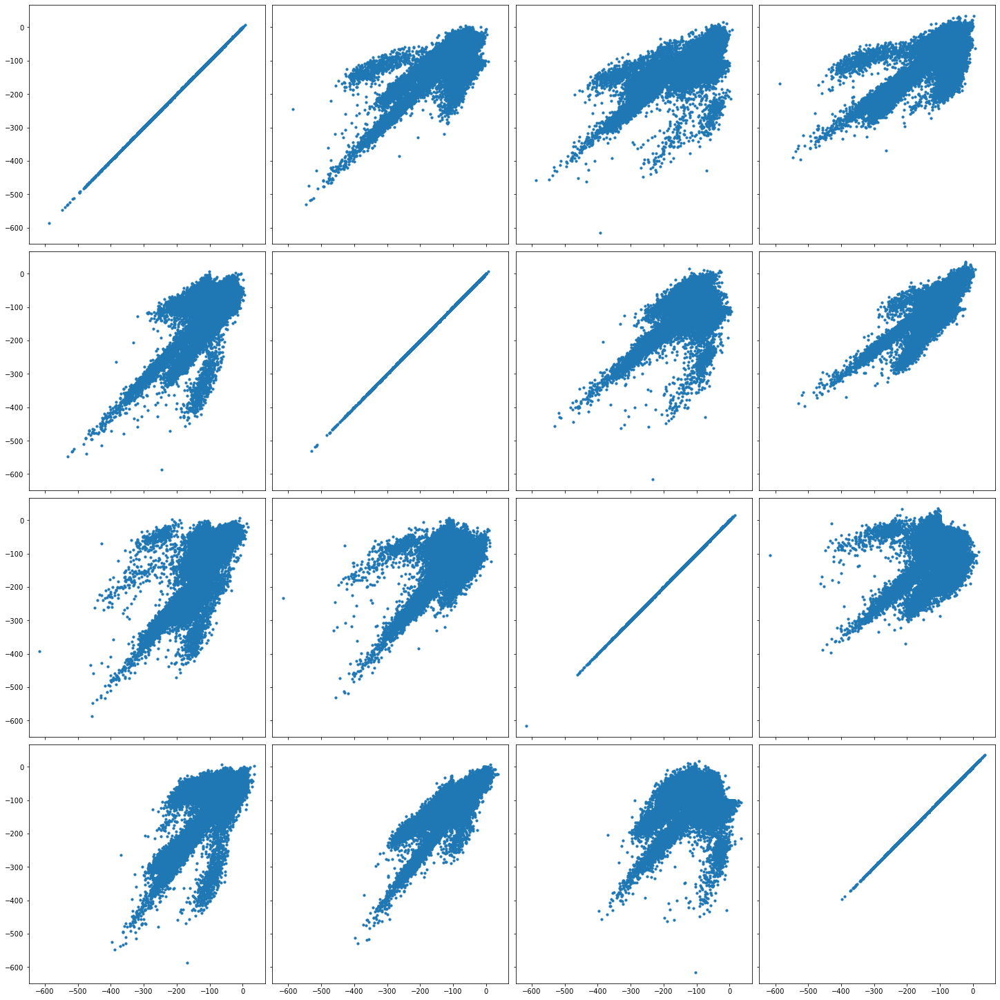

In [26]:
marks_single = (UnitMarksIndicator & {
    'nwb_file_name': nwb_copy_file_name,
    'sort_group_id': 3,
    'interval_list_name': 'pos 3 valid times',   
}).fetch_xarray()
UnitMarksIndicator.plot_all_marks(marks_single)

## Position

After the marks look good, you'll need to load/populate the 2D position data. This comes from the `IntervalPositionInfo` table. See the position tutorial for more information. Note that we will need to upsample the position data (which is done here via the `default_decoding` parameters) to match the sampling frequency that we intend to decode in (2 ms time bins or 500 Hz sampling rate)

Next we populate/load the linearized position tables. Again refer to the linear position tutorials for more information.

In [64]:
from spyglass.common.common_position import IntervalLinearizedPosition

linear_position_df = (IntervalLinearizedPosition() &
 {'nwb_file_name': nwb_copy_file_name,
  'interval_list_name': 'pos 3 valid times',
  'position_info_param_name': 'default_decoding'}
).fetch1_dataframe()

linear_position_df

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220420_680I7IT916.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)


,linear_position,track_segment_id,projected_x_position,projected_y_position
time,,,,
1.650478e+09,NaN,0,NaN,NaN
1.650478e+09,NaN,0,NaN,NaN
1.650478e+09,NaN,0,NaN,NaN
1.650478e+09,NaN,0,NaN,NaN
1.650478e+09,NaN,0,NaN,NaN
...,...,...,...,...
1.650480e+09,1.231313,0,210.335450,232.771656
1.650480e+09,1.234147,0,210.335647,232.768829
1.650480e+09,1.236981,0,210.335843,232.766001


We should also quickly visualize the linear position in order to sanity check the values. Here we plot the 2D position projected to its corresponding 1D segment.

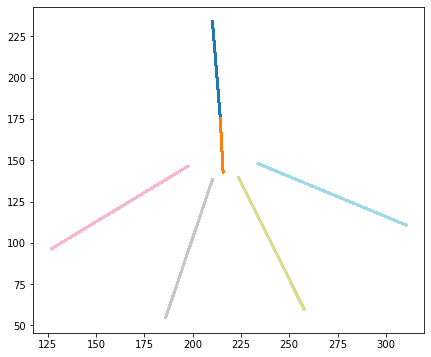

In [28]:
plt.figure(figsize=(7, 6))
plt.scatter(linear_position_df.projected_x_position, linear_position_df.projected_y_position,
            c=linear_position_df.track_segment_id, cmap='tab20', s=1)

We should also plot the linearized position itself to make sure it is okay.

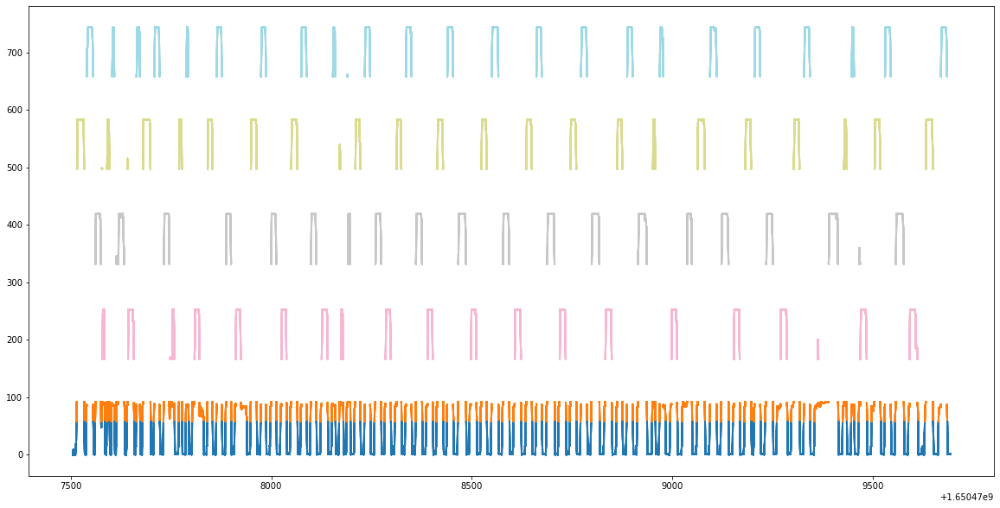

In [29]:
plt.figure(figsize=(20, 10))
plt.scatter(linear_position_df.index, linear_position_df.linear_position, s=1,
            c=linear_position_df.track_segment_id, cmap='tab20')

Okay now that we've looked at the data, we should quickly verify that all our data is the same size.

We also want to make sure we have valid ephys data and valid position data for decoding. Here we only have one valid time interval, but if we had more than one, we should decode on each interval separately.

In [67]:
sort_interval_name='04_Seq2Session2'
pos_interval_name='pos 3 valid times'

key = {}
key['interval_list_name'] = sort_interval_name
key['nwb_file_name'] = nwb_copy_file_name

interval = (IntervalList &
            {'nwb_file_name': key['nwb_file_name'],
             'interval_list_name': key['interval_list_name']}
           ).fetch1('valid_times')

valid_ephys_times = (IntervalList &
                     {'nwb_file_name': key['nwb_file_name'],
                      'interval_list_name': 'raw data valid times'}
                    ).fetch1('valid_times')
position_interval_names = (IntervalPositionInfo &
                           {'nwb_file_name': key['nwb_file_name'],
                            'position_info_param_name': 'default_decoding',
                           }
                          ).fetch('interval_list_name')

valid_pos_times = (IntervalList &
                   {'nwb_file_name': key['nwb_file_name'],
                    'interval_list_name': pos_interval_name}
                  ).fetch1('valid_times')

intersect_interval = interval_list_intersect(
    interval_list_intersect(interval, valid_ephys_times), valid_pos_times)

marks_=[]
linear_position_df_=[]
for i in range(len(intersect_interval)):
    valid_time_slice = slice(intersect_interval[i][0], intersect_interval[i][1])
    
    linear_position_df_.append(linear_position_df.loc[valid_time_slice])
    marks_.append(marks.sel(time=valid_time_slice))

marks=xr.concat(marks_,dim='time')
linear_position_df=pd.concat(linear_position_df_)
marks.shape, linear_position_df.shape

TypeError: can only concatenate xarray Dataset and DataArray objects, got <class 'pandas.core.frame.DataFrame'>

In [69]:
marks.shape, linear_position_df.shape

((1080566, 4, 21), (1080566, 4))

In [31]:

#position_info = position_info.loc[valid_time_slice]

## Decoding

Okay, now having sanity checked the data, we can finally get to decoding. In the future this will be a pipeline, but for now it is manual as the table structure is still being prototyped. 

In order to set the parameters, we can fetch the default parameters and modify them.

For 1D decoding, it is best to pass in the track graph and track graph parameters we used for linearization in order for the random walk to be handled properly. We can also set the amount of smoothing in the position and mark dimensions: `position_std` and `mark_std` respectively. Finally we set the `block_size`, which controls how many samples get processed at a time so that we don't run out of GPU memory.

In [70]:
from spyglass.decoding.clusterless import ClusterlessClassifierParameters
ClusterlessClassifierParameters()

classifier_param_name a name for this set of parameters,classifier_params initialization parameters,fit_params fit parameters,predict_params prediction parameters
default_decoding_cpu,=BLOB=,=BLOB=,=BLOB=
default_decoding_gpu,=BLOB=,=BLOB=,=BLOB=
default_decoding_gpu_source,=BLOB=,=BLOB=,=BLOB=
fork_maze_HaightLeft,=BLOB=,=BLOB=,=BLOB=
fork_maze_HaightRight,=BLOB=,=BLOB=,=BLOB=
pipt,=BLOB=,=BLOB=,=BLOB=
pipt_1,=BLOB=,=BLOB=,=BLOB=
popt,=BLOB=,=BLOB=,=BLOB=
popt_1,=BLOB=,=BLOB=,=BLOB=
ppt_1,=BLOB=,=BLOB=,=BLOB=


In [71]:
from replay_trajectory_classification.environments import Environment
from spyglass.common.common_position import TrackGraph
from spyglass.decoding.clusterless import ClusterlessClassifierParameters

import pprint

#parameters = (ClusterlessClassifierParameters() & {'classifier_param_name': 'default_decoding_cpu'}).fetch1()
parameters = (ClusterlessClassifierParameters() & {'classifier_param_name': 'default_decoding_gpu'}).fetch1()

track_graph = (TrackGraph() & {'track_graph_name': '4 arm lumped'}).get_networkx_track_graph()
track_graph_params = (TrackGraph() & {'track_graph_name': '4 arm lumped'}).fetch1()

parameters['classifier_params']['environments'] = [
    Environment(
    track_graph=track_graph,
    edge_order=track_graph_params['linear_edge_order'],
    edge_spacing=track_graph_params['linear_edge_spacing'])]

parameters['classifier_params']['clusterless_algorithm'] = 'multiunit_likelihood_integer'
parameters['classifier_params']['clusterless_algorithm_params'] = {
    'mark_std': 24.0,
    'position_std': 6.0,
    'block_size': 100,
 }

pprint.pprint(parameters)

{'classifier_param_name': 'default_decoding_gpu',
 'classifier_params': {'clusterless_algorithm': 'multiunit_likelihood_integer',
                       'clusterless_algorithm_params': {'block_size': 100,
                                                        'mark_std': 24.0,
                                                        'position_std': 6.0},
                       'continuous_transition_types': [[RandomWalk(environment_name='', movement_var=6.0, movement_mean=0.0, use_diffusion=False),
                                                        Uniform(environment_name='', environment2_name=None)],
                                                       [Uniform(environment_name='', environment2_name=None),
                                                        Uniform(environment_name='', environment2_name=None)]],
                       'discrete_transition_type': DiagonalDiscrete(diagonal_value=0.98),
                       'environments': [Environment(environment_name='', 

After we set the parameters, we can run the decoding.

In [ ]:
from replay_trajectory_classification import ClusterlessClassifier

GPU_ID = 5

# use context manager to specify which GPU (device)
with cp.cuda.Device(GPU_ID):

    classifier = ClusterlessClassifier(**parameters['classifier_params'])
    classifier.fit(
        position=linear_position_df.linear_position.values,
        multiunits=marks.values,
        **parameters['fit_params']
    )
    results = classifier.predict(
        multiunits=marks.values,
        time=linear_position_df.index,
        **parameters['predict_params']
    )
    logging.info('Done!')

    results

26-Jun-22 15:54:33 Fitting initial conditions...
26-Jun-22 15:54:33 Fitting continuous state transition...
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/replay_trajectory_classification/continuous_state_transitions.py:12: RuntimeWarning: invalid value encountered in true_divide
  x /= x.sum(axis=1, keepdims=True)
26-Jun-22 15:54:34 Fitting discrete state transition
26-Jun-22 15:54:34 Fitting multiunits...
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/replay_trajectory_classification/likelihoods/multiunit_likelihood_integer.py:82: RuntimeWarning: divide by zero encountered in log
  return np.log(mean_rate) + np.log(density) - np.log(occupancy)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/replay_trajectory_classification/likelihoods/multiunit_likelihood_integer.py:82: RuntimeWarning: invalid value encountered in subtract
  return np.log(mean_rate) + np.log(density) - np.log(occupancy)
26-Jun-22 15:54:44 Estimating likelihood

n_electrodes:   0%|          | 0/21 [00:00<?, ?it/s]

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/replay_trajectory_classification/likelihoods/multiunit_likelihood_integer.py:445: RuntimeWarning: overflow encountered in add
  log_likelihood[np.ix_(is_spike, is_track_interior)] += np.nan_to_num(


In [76]:
decode_path=os.path.join('/stelmo/shijie/recording_pilot/molly/decoding',nwb_copy_file_name+sort_interval_name+'.nc')
results.to_netcdf(decode_path)

In [78]:
key={'nwb_file_name':nwb_copy_file_name,
     'interval_list_name':sort_interval_name,
     'posterior':decode_path}
Decode().insert1(key,replace=True)

In [ ]:
float(results.time[60000])

Finally, we can plot the decodes to make sure they make sense.

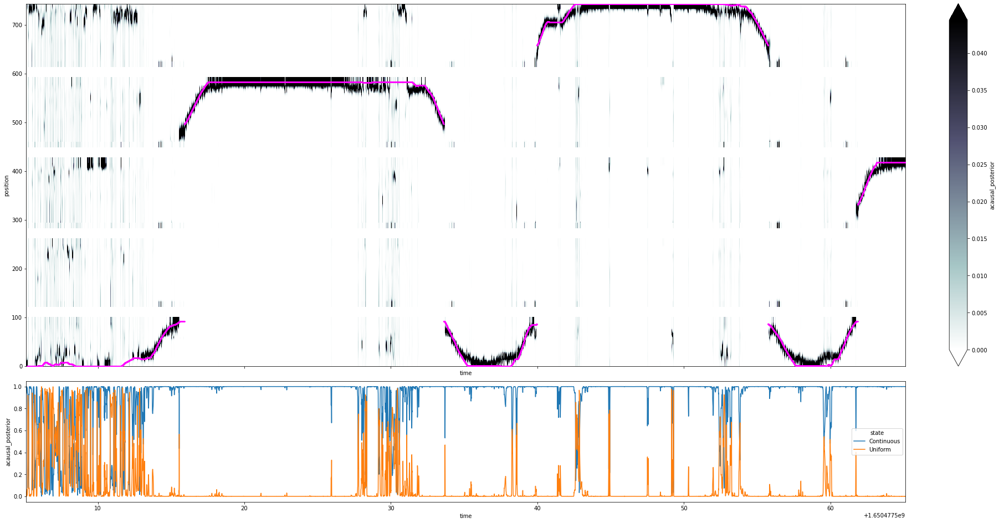

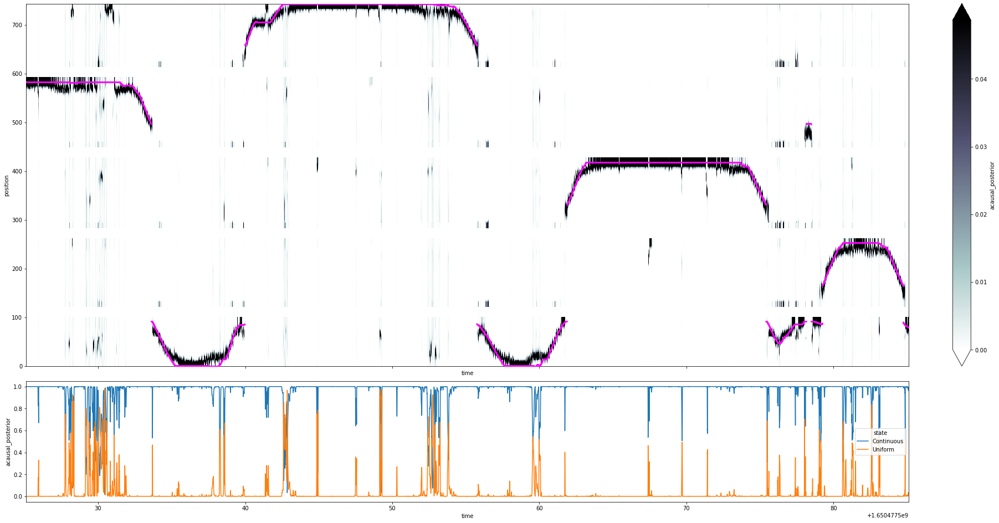

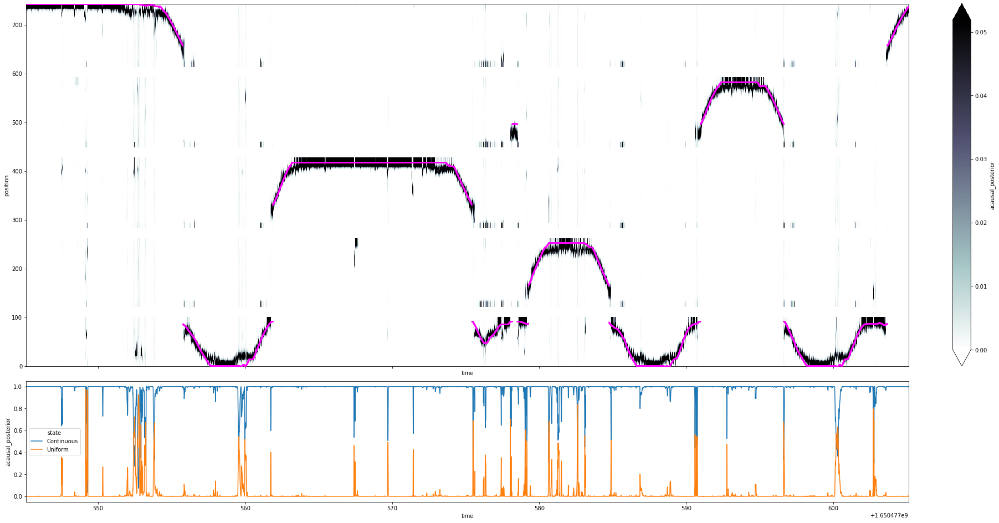

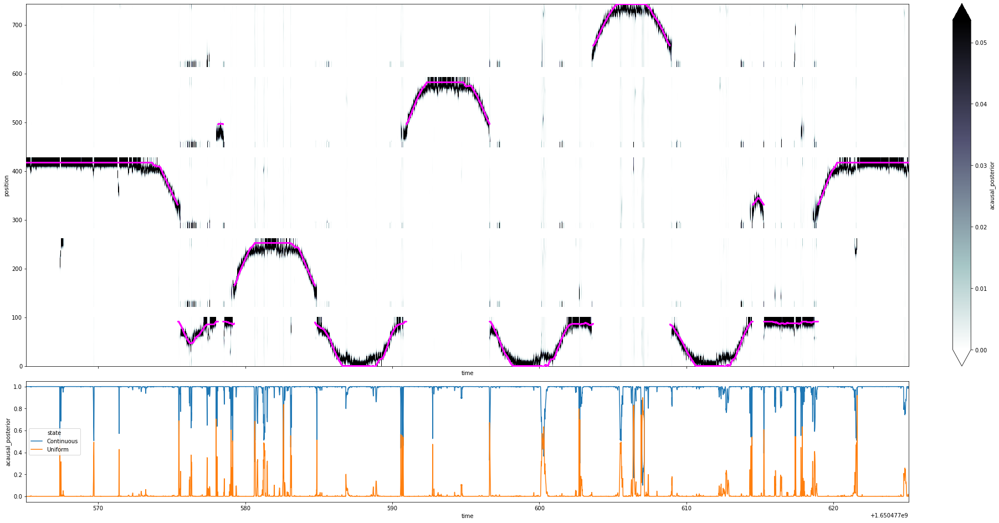

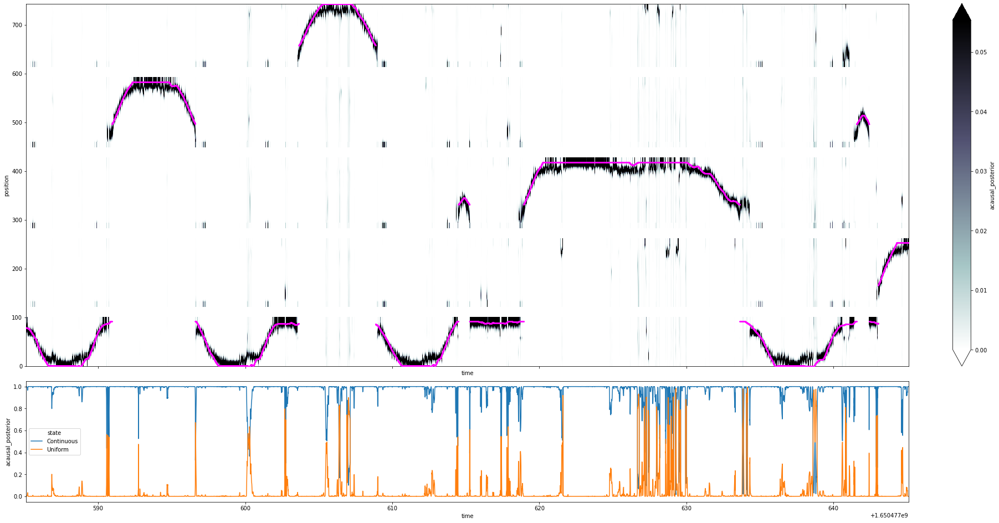

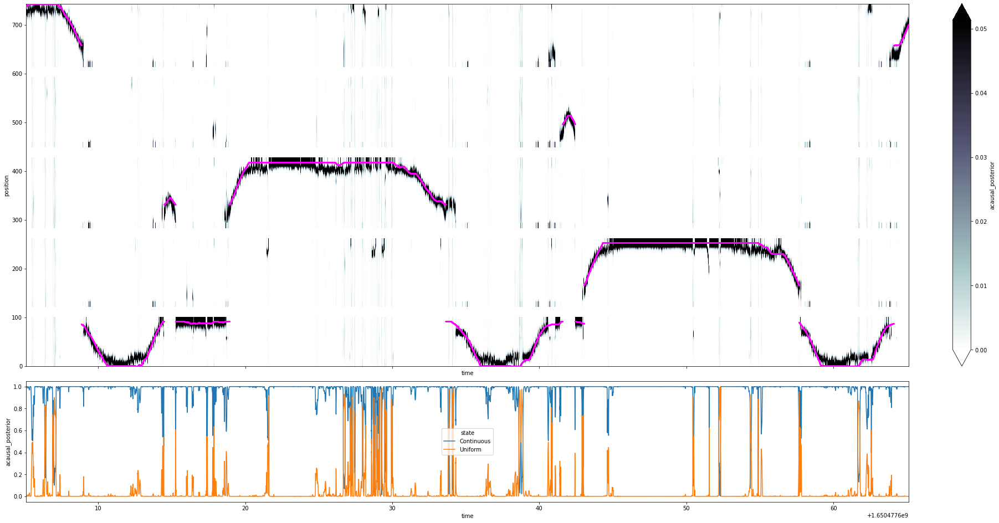

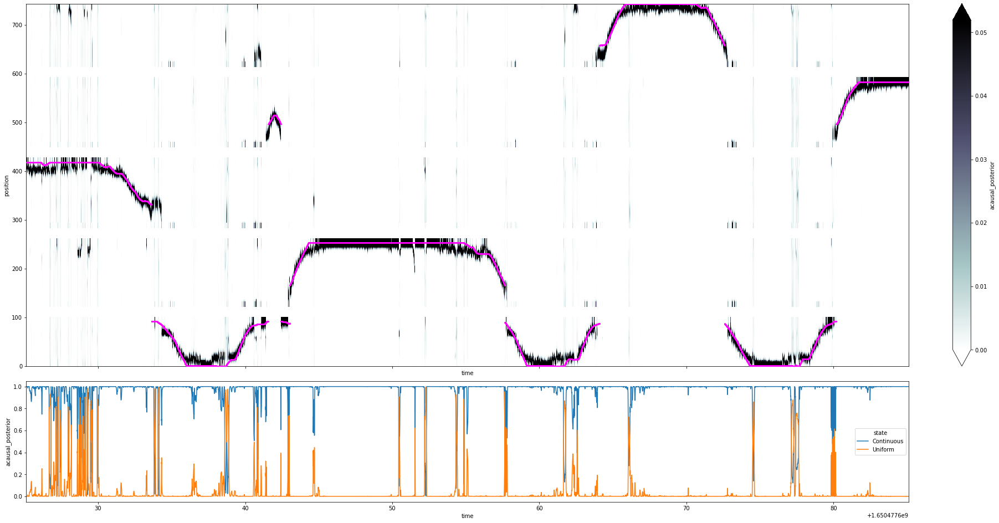

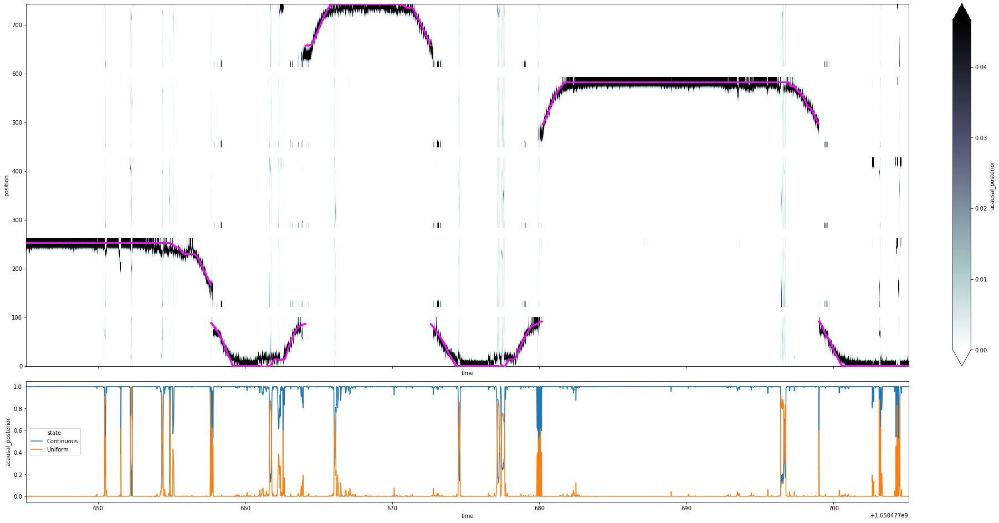

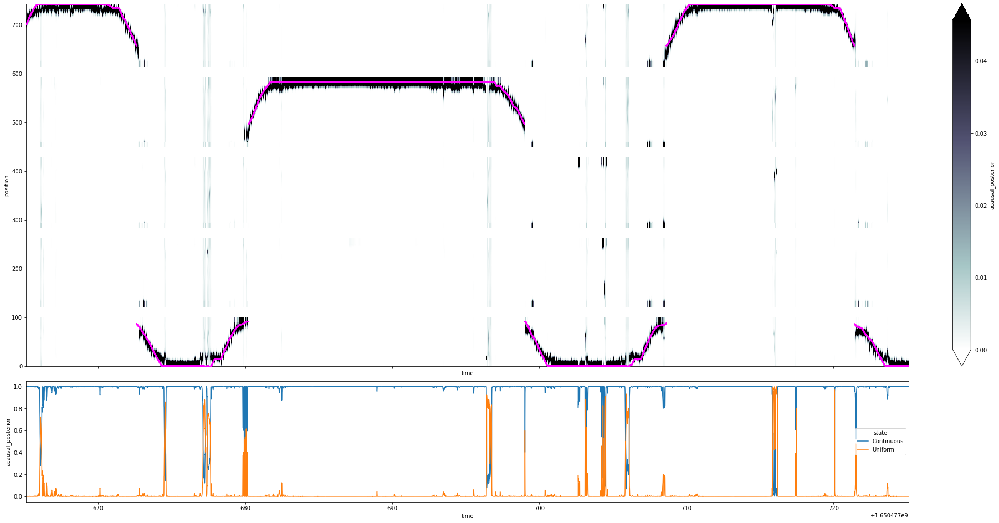

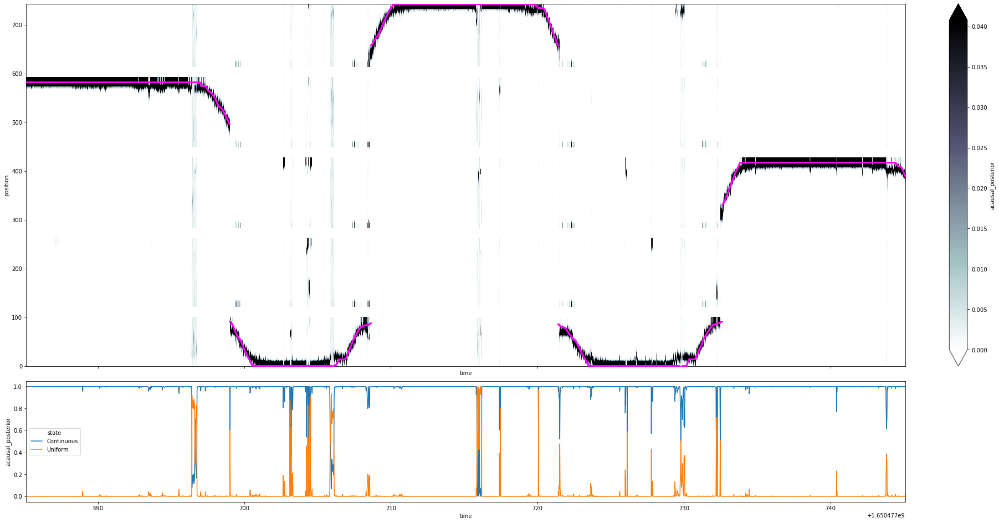

In [79]:
import matplotlib.pyplot as plt
for time_ind in range(0, 100_000, 10_000): #range(0, 600_000, 100_000)
    time_slice = slice(time_ind, time_ind + 30_000)

    fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)
    results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
    axes[0].scatter(linear_position_df.iloc[time_slice].index,
                    linear_position_df.iloc[time_slice].linear_position.values,
                    s=1, color='magenta', zorder=10)
 
    results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

In [ ]:
import matplotlib.pyplot as plt

#timestart=111_200
timestart=timestart+500
time_slice = slice(timestart, timestart+500)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

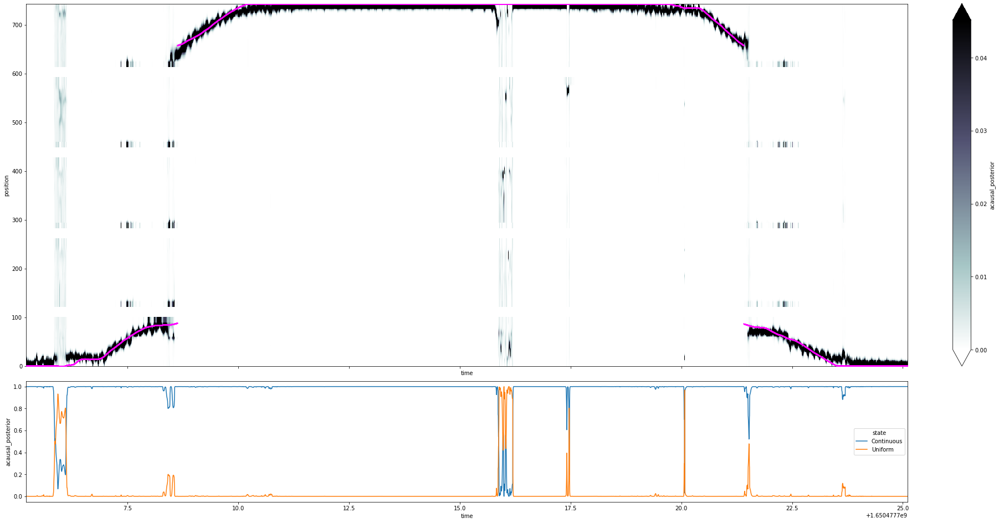

In [134]:
import matplotlib.pyplot as plt

time_slice = slice(100_050, 110_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

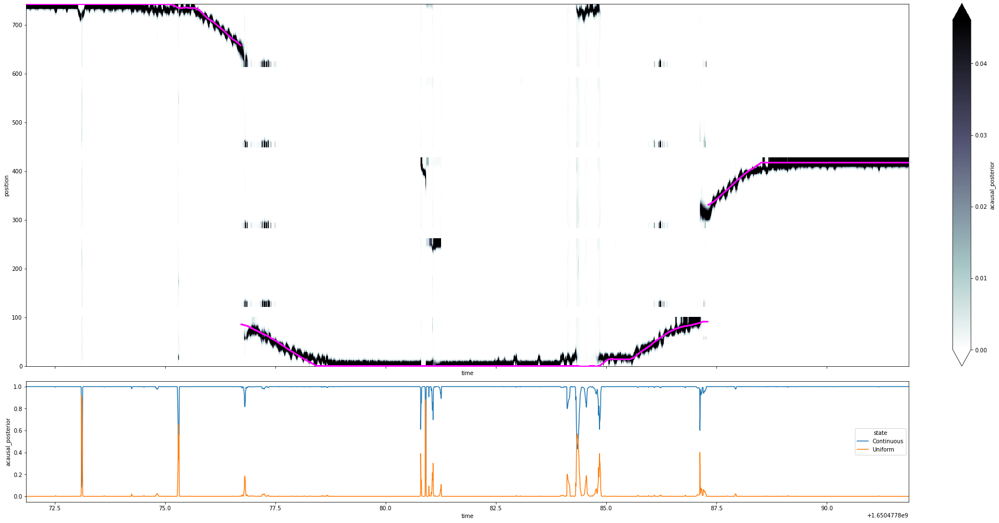

In [89]:
import matplotlib.pyplot as plt

time_slice = slice(180_000, 190_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

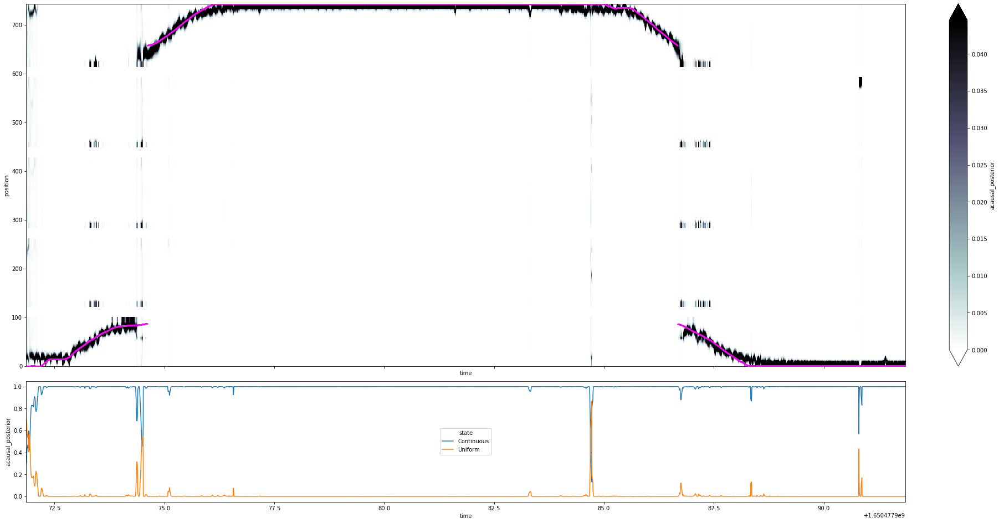

In [90]:
import matplotlib.pyplot as plt

time_slice = slice(230_000, 240_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

In [91]:
from trajectory_analysis_tools import get_trajectory_data, get_ahead_behind_distance

trajectory_data = get_trajectory_data(
    results.sum('state').acausal_posterior,
    track_graph,
    classifier,
    linear_position_df[['projected_x_position', 'projected_y_position']],
    linear_position_df.track_segment_id,
    position_info.head_orientation,
)

ahead_behind_distance = get_ahead_behind_distance(
    track_graph, *trajectory_data)
mental_position_edges = trajectory_data[-1]
mental_position_edge_id = np.asarray(
    [track_graph.edges[edge]['edge_id'] for edge in mental_position_edges])

NameError: name 'position_info' is not defined

In [30]:
from ripple_detection import get_multiunit_population_firing_rate

SAMPLING_FREQUENCY = 500

multiunit_spikes = (np.any(~np.isnan(marks.values), axis=1)
                    ).astype(float)
multiunit_firing_rate = pd.DataFrame(
    get_multiunit_population_firing_rate(
        multiunit_spikes, SAMPLING_FREQUENCY), index=marks.time,
    columns=['firing_rate'])

In [31]:
from ripple_detection import multiunit_HSE_detector

multiunit_high_synchrony_times = multiunit_HSE_detector(
    marks.time.values,
    multiunit_spikes,
    position_info.head_speed.values,
    sampling_frequency=SAMPLING_FREQUENCY,
    minimum_duration=0.015,
    zscore_threshold=2.0,
    close_event_threshold=0.000)

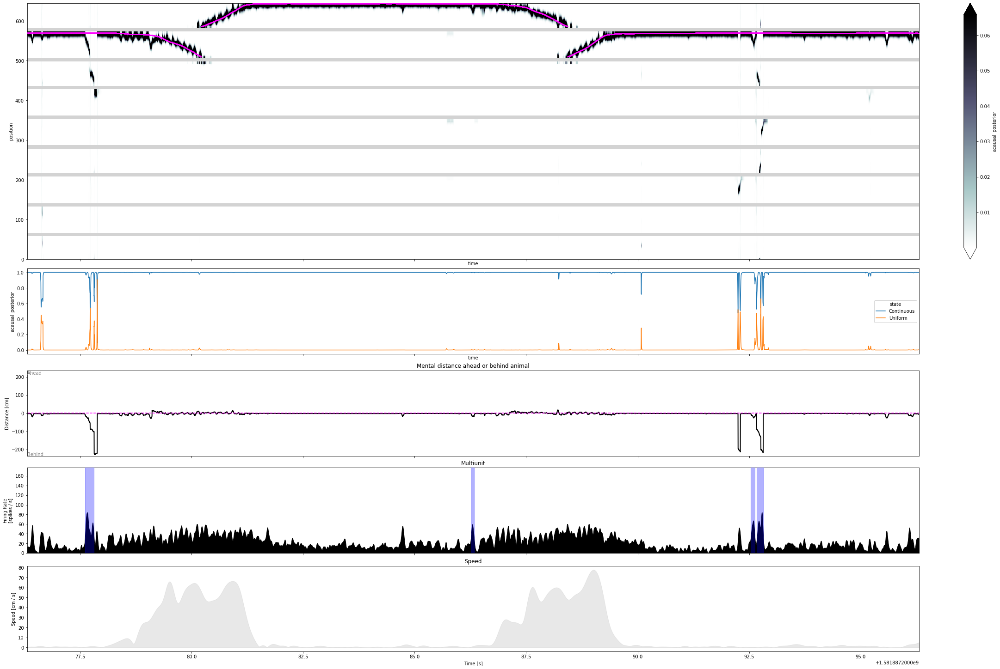

In [32]:
import matplotlib.pyplot as plt
import copy


def plot_classifier(
    time_slice,
    results,
    classifier,
    position_info,
    linear_position_df,
    ahead_behind_distance,
    multiunit_firing_rate,
    multiunit_high_synchrony_times,
    cmap='bone_r',
    figsize=(30, 20)
):

    cmap = copy.copy(plt.cm.get_cmap(cmap))
    cmap.set_bad(color="lightgrey", alpha=1.0)

    fig, axes = plt.subplots(5, 1, figsize=figsize, sharex=True, constrained_layout=True,
                             gridspec_kw={"height_ratios": [3, 1, 1, 1, 1]},)

    time = results.isel(time=time_slice).time
    (results
     .isel(time=time_slice)
     .acausal_posterior
     .sum('state')
     .where(classifier.environments[0].is_track_interior_)
     .plot(x='time', y='position', ax=axes[0], robust=True, cmap=cmap))
    axes[0].scatter(time,
                    linear_position_df.iloc[time_slice].linear_position.values,
                    s=1, color='magenta', zorder=10)

    results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])
    axes[2].plot(time,
                 ahead_behind_distance[time_slice],
                 color="black", linewidth=2)
    axes[2].axhline(0, color="magenta", linestyle="--")
    axes[2].set_title("Mental distance ahead or behind animal")
    axes[2].set_ylabel("Distance [cm]")
    max_dist = np.max(np.abs(ahead_behind_distance)) + 5
    axes[2].set_ylim((-max_dist, max_dist))
    axes[2].text(time[0], max_dist - 1, "Ahead", color="grey", va='top')
    axes[2].text(time[0], -max_dist + 1, "Behind", color="grey")

    # ax 3
    axes[3].fill_between(
        multiunit_firing_rate.iloc[time_slice].index.values,
        multiunit_firing_rate.iloc[time_slice].values.squeeze(),
        color="black",
    )
    axes[3].set_ylabel("Firing Rate\n[spikes / s]")
    axes[3].set_title("Multiunit")
    axes[3].set_ylim((0.0, np.max(np.asarray(multiunit_firing_rate))))


    cur_multiunit_HSE = interval_list_intersect(
        np.asarray(multiunit_high_synchrony_times),
        np.asarray([(time[0], time[-1])]))

    for start_time, end_time in cur_multiunit_HSE:
        axes[3].axvspan(start_time, end_time, color='blue', alpha=0.3, zorder=10)

    # ax 4
    axes[4].fill_between(
        time,
        position_info.iloc[time_slice]
        .head_speed.values.squeeze(),
        color="lightgrey",
        linewidth=1,
        alpha=0.5,
    )
    axes[4].set_title('Speed')
    axes[4].set_ylabel("Speed [cm / s]")
    axes[4].set_xlabel("Time [s]")
    

time_slice = slice(180_000, 190_000)
plot_classifier(time_slice, results, classifier, position_info, linear_position_df, ahead_behind_distance,
                multiunit_firing_rate, multiunit_high_synchrony_times)

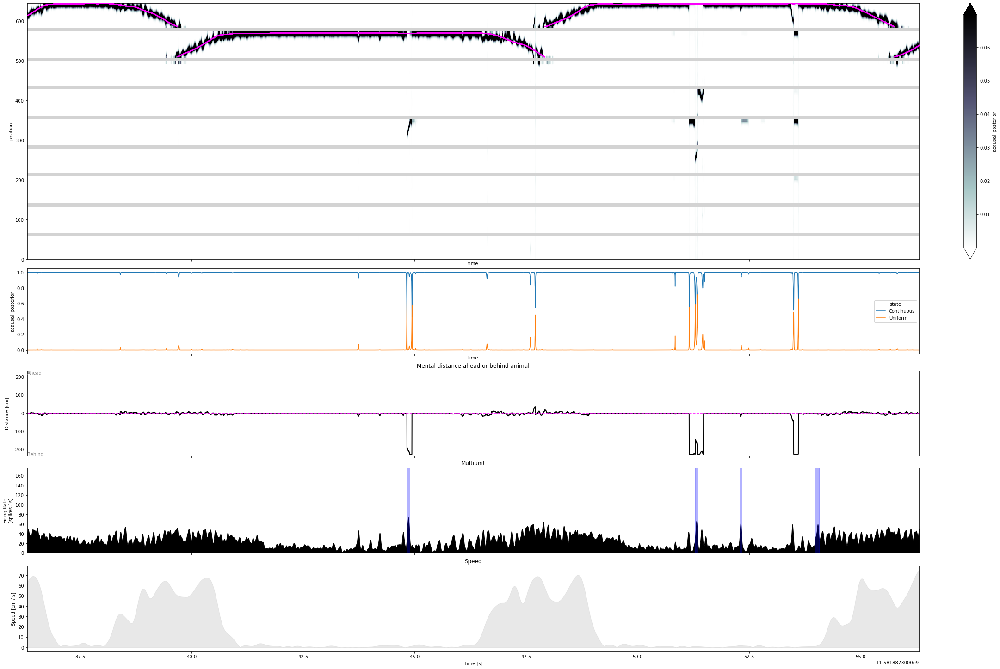

In [33]:
time_slice = slice(210_000, 220_000)
plot_classifier(time_slice, results, classifier, position_info, linear_position_df, ahead_behind_distance,
                multiunit_firing_rate, multiunit_high_synchrony_times)

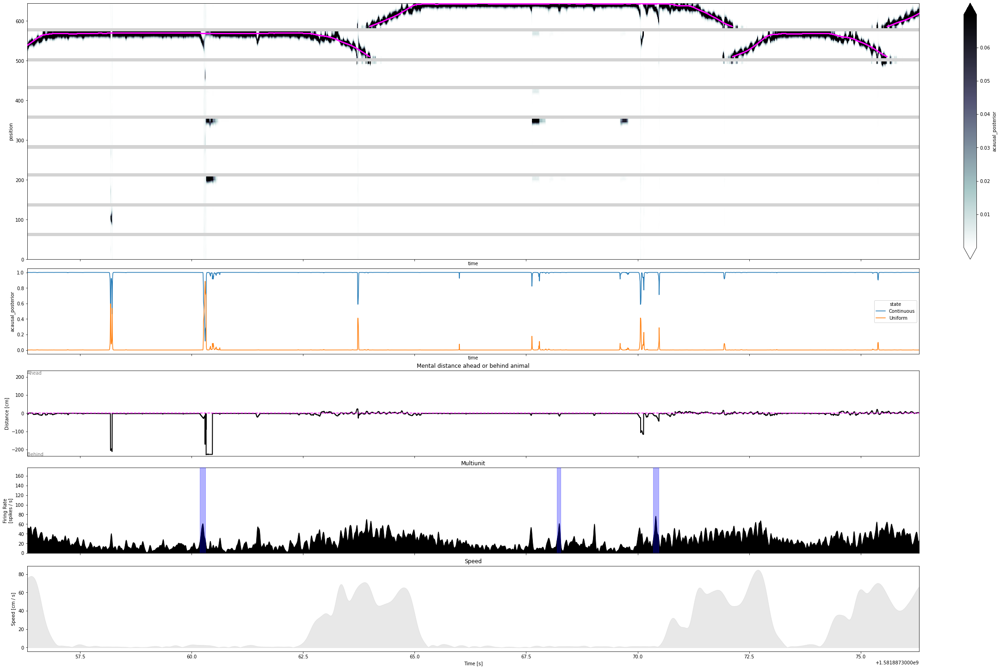

In [34]:
time_slice = slice(220_000, 230_000)
plot_classifier(time_slice, results, classifier, position_info, linear_position_df, ahead_behind_distance,
                multiunit_firing_rate, multiunit_high_synchrony_times)